# Image denoising

## Introduction

What is image noise?

Image noise is defined as random variation of brightness or color information in images.

There are various types of image noise and we will be focusing on noise called __salt-and-pepper noise__ (Black and White).

This type of noise is usually caused by analog to digital converting error or bit error in transmission.

To restore the image noise, we do a process called __Image denoising__. 

Like there are various types of image noise, there are also various ways to denoise the image noise.

We will be using __Filtering technique__ especially two method called _Mean filter_ and _Median filter_.

### Mean Filter Method

We consider each pixels of our photo in array format.

To use this method, we select one location of a pixel as $ A_{i,j} $ where $ i = 1, j = 1$ .

Then we call the surrounding of that pixel as $s \times s$ matrix where $s = odd$ since we need to verify the very middle pixel.

Finally, we use numpy `mean` feature to calculate the mean with those values and replace in location of $ A_{i,j} $.



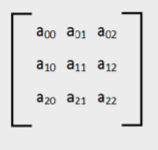

### Median Filter Method

We evaluate Median Filter same as Mean filter which was taking $s \times s$ where $s=odd$ then use numpy `median`.

The function of these two methods are

Mean Filter takes the surrounding pixels and switch to average pixel value which it could decrease the unnatural pixels(noises).

Median Filter takes the surrounding pixels and switch to middle pixel value which it could terminate the unnatural pixels(noises).

Our main goal in this project is to explore how both __Mean filter__ and __Median filter__ work and verify which of two function better.

During the process, we will be creating a function that create noises on image, function of two filters, and function of new filter.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

While we are dealing with __Salt and Pepper noise__, we need to switch the images into gray scale by using `cmap`.

Below is the code to read image, transform 3(RGB) channels into 1 channel by using the formula.

While there is 2 possibilites of image use either [0,1] and [0,255] in scale, we divide $ 1 \div 255 $ if they use [0,255].

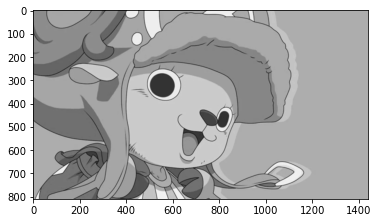

In [2]:
# Read img/ convert to B/W / convert to [0,1]
temp_img = plt.imread('chopper3.jpg') # read image
r= temp_img[:,:,0] # red
g= temp_img[:,:,1] # green
b= temp_img[:,:,2] # blue
img = 0.299*r + 0.587 * g + 0.114 * b # forumla transform to 1 channel
plt.imshow(img, cmap='gray') # gray scale image
img = img / 255  # divide by 255 since it follow [0,255]



In [3]:
k = img < 1  # method to check the range of color pixel. If all are not True, then it follows [0,255]
k

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

Below is a function to create salt and pepper noises.

In [4]:
def sp_noise(img,noise): # input as img and noise level

    each_scale = noise / 2 # we divide the noise level by 2 in order to equally noise of Black and White.

    rand_a = np.random.random(img.shape) # Create random numbers between [0,1] as same shape of img.
    pick_white = rand_a < each_scale # half scale create white noise
    pick_black = rand_a > (1- each_scale) # half scale create black noise
    img[pick_black]= 0
    img[pick_white]= 1
    plt.imshow(img, cmap='gray')
    
    return img
            
    

array([[0.55257255, 0.55257255, 0.55257255, ..., 1.        , 1.        ,
        0.        ],
       [0.55257255, 1.        , 0.        , ..., 0.67867059, 0.        ,
        0.67867059],
       [0.        , 0.55257255, 0.        , ..., 0.67867059, 1.        ,
        0.        ],
       ...,
       [0.68012157, 1.        , 1.        , ..., 0.67867059, 0.67867059,
        0.67867059],
       [0.67922745, 0.67922745, 0.67918431, ..., 0.        , 0.67867059,
        0.67867059],
       [1.        , 1.        , 0.67918431, ..., 0.67867059, 0.67867059,
        0.67867059]])

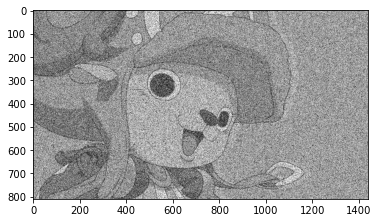

In [5]:
sp_noise(img,0.4)

Now we have added noise to our image, we create function of filters to remove the noises.

Below is the function of __Mean filter__ and __Median filter__ combined into one function.

In [6]:
def m_filter(img,s,method): # input as image, size of each col & rows, method either(mean, median) 
    s_expand= (s-1)// 2  # (3x3 =>  (3-1)/2 = 1  =>  distance from center pixel)
    img_col = img.shape[0] + 2*s_expand # expanding top and bottom by "s_expand" for grid
    img_row = img.shape[1] + 2*s_expand # expanding left and right by "s_expand" for grid
    grid_img = np.ones((img_col, img_row)) # shape of gird image contained with 1s
    grid_img[s_expand:img_col-s_expand,s_expand:img_row-s_expand] = img  # replace 1s to original image inside the grid
    img_copy = grid_img.copy() # copy of grid image inorder to prevent changes through out the filter calculation.
    
    for i in range(s_expand, img_col-s_expand): # col inside grid
        for j in range(s_expand, img_row-s_expand): # row inside grid
            s_by_s = img_copy[i-s_expand:i+s_expand+1,j-s_expand:j+s_expand+1] # s x s matrix where img[i,j] is center
            if (method == "mean"):
                s_mean = np.mean(s_by_s) # mean of matrix above
                grid_img[i,j] = s_mean # replace the mean value to original grid_img
            if (method == "median"):
                s_median = np.median(s_by_s) # median of matrix above
                grid_img[i,j] = s_median # replace the median value to original grid_img
    plt.figure(figsize=(10,10))
    plt.imshow(grid_img, cmap='gray')
    return grid_img
            

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

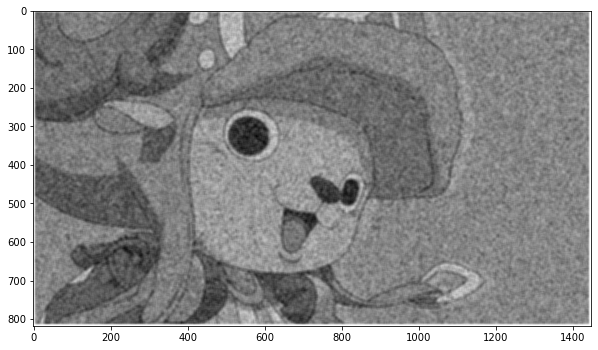

In [7]:
m_filter(img,9,'mean')

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

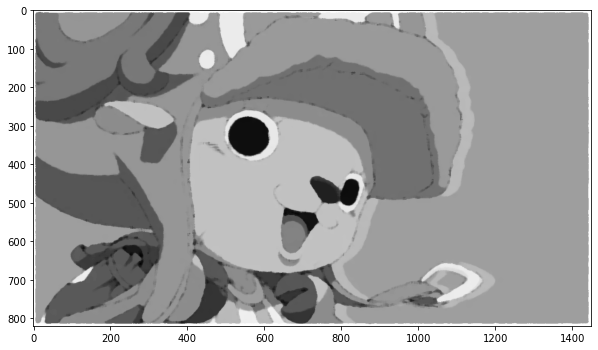

In [8]:
m_filter(img,11,"median")

### New formula trial

With the original format of filter code, we can come up with new filter with different formulas.

In `new_filter(img,s)`, we will try the formula of maximum value - minimum value. 
     

In [9]:
def new_filter(img,s):
    s_expand= (s-1)// 2  # (3x3 =>  (3-1)/2 = 1  =>  distance from center pixel)
    img_col = img.shape[0] + 2*s_expand # expanding top and bottom by "s_expand" for grid
    img_row = img.shape[1] + 2*s_expand # expanding left and right by "s_expand" for grid
    grid_img = np.ones((img_col, img_row)) # shape of gird image contained with 1s
    grid_img[s_expand:img_col-s_expand,s_expand:img_row-s_expand] = img # replace 1s to original image inside the grid
    img_copy = grid_img.copy() # copy of grid image inorder to prevent changes through out the filter calculation.
    
    for i in range(s_expand, img_col-s_expand): # col inside grid
        for j in range(s_expand, img_row-s_expand): # row inside grid
            s_by_s = img_copy[i-s_expand:i+s_expand +1,j-s_expand:j+s_expand+1] # s x s matrix where img[i,j] is center
            s_max_min = np.max(s_by_s)-np.min(s_by_s) # Maximum value - minimum value
            grid_img[i,j] = s_max_min
    plt.figure(figsize=(10,10))
    plt.imshow(grid_img, cmap='gray')
    return grid_img

array([[1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 0.44742745, 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       ...,
       [1.        , 0.32077255, 0.32081569, ..., 0.67867059, 0.32132941,
        1.        ],
       [1.        , 0.32077255, 0.32081569, ..., 1.        , 0.32132941,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ]])

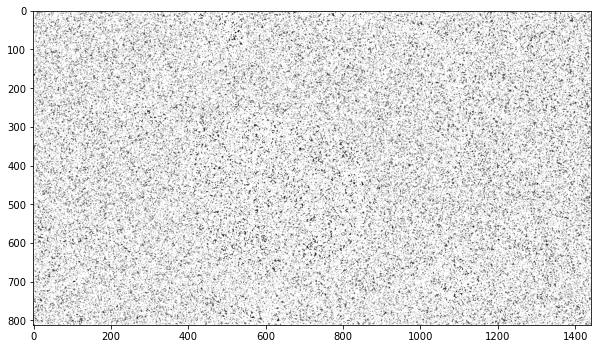

In [10]:
new_filter(img,3)

According to new filter trial, it did not show any improvement by looking at the result. My intention was to smoothly connect surround pixels from noises where it ruins the natural out look. However, new trial filter only destroy the original images and did not improve denosing. 

Example images (Face)

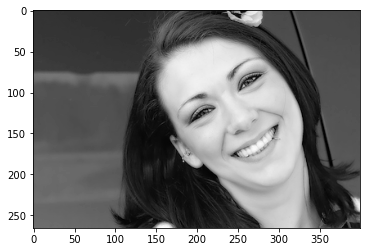

In [11]:
# Read img/ convert to B/W / convert to [0,1]
temp_img = plt.imread('face.png') # read image
r= temp_img[:,:,0] # red
g= temp_img[:,:,1] # green
b= temp_img[:,:,2] # blue
img = 0.299*r + 0.587 * g + 0.114 * b # forumla transform to 1 channel
plt.imshow(img, cmap='gray')


In [12]:
k = img < 1 # method to check the range of color pixel. If all are not True, then it follows [0,255]
k

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

array([[0.1882353 , 0.1882353 , 1.        , ..., 0.        , 0.25490198,
        0.2509804 ],
       [1.        , 1.        , 0.1882353 , ..., 0.        , 0.        ,
        0.2509804 ],
       [0.        , 0.18431373, 0.18431373, ..., 0.25490198, 1.        ,
        0.25490198],
       ...,
       [0.        , 0.40784317, 0.        , ..., 0.        , 0.10196079,
        0.09411765],
       [1.        , 0.41176474, 1.        , ..., 0.11372549, 0.09803922,
        0.09019608],
       [0.        , 1.        , 0.40392157, ..., 1.        , 0.        ,
        0.        ]], dtype=float32)

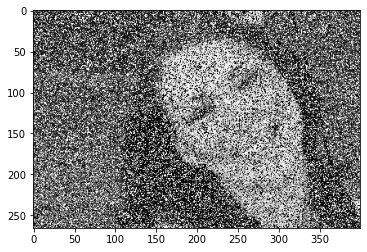

In [13]:
sp_noise(img,0.5)

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

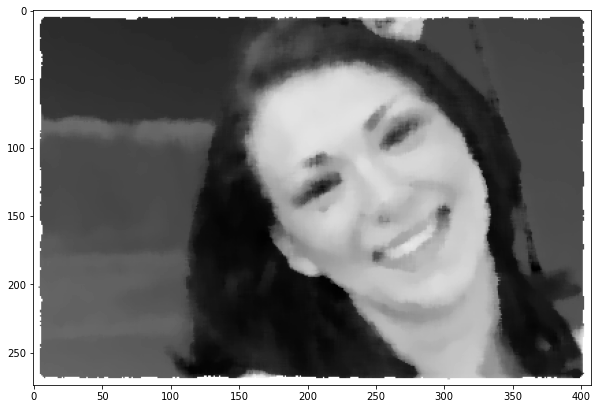

In [14]:
m_filter(img,9,"median")

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

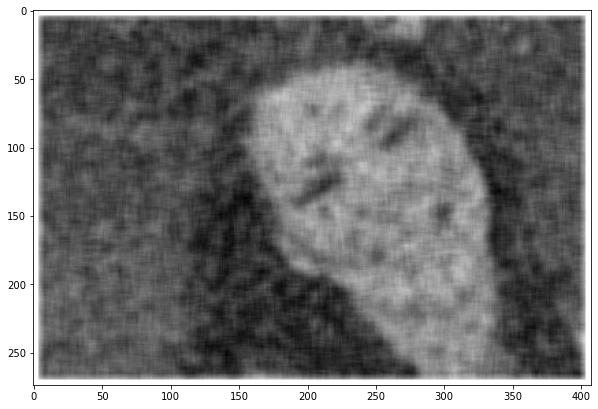

In [15]:
m_filter(img,9,"mean")

array([[1.       , 1.       , 1.       , ..., 1.       , 1.       ,
        1.       ],
       [1.       , 0.8117647, 0.8117647, ..., 1.       , 1.       ,
        1.       ],
       [1.       , 1.       , 1.       , ..., 1.       , 1.       ,
        1.       ],
       ...,
       [1.       , 1.       , 1.       , ..., 1.       , 1.       ,
        1.       ],
       [1.       , 1.       , 1.       , ..., 1.       , 1.       ,
        1.       ],
       [1.       , 1.       , 1.       , ..., 1.       , 1.       ,
        1.       ]])

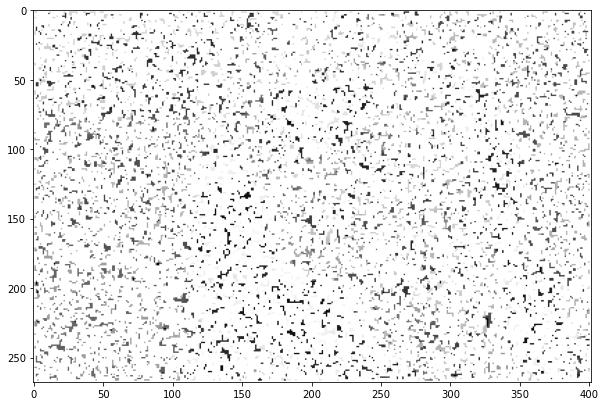

In [16]:
new_filter(img,3)

Example images (Boston)

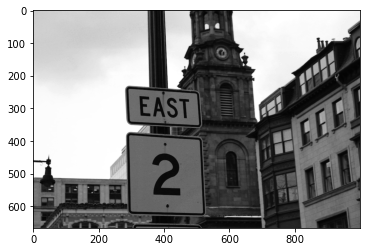

In [17]:
# Read img/ convert to B/W / convert to [0,1]
temp_img = plt.imread('boston.png')
r= temp_img[:,:,0] # red
g= temp_img[:,:,1] # green
b= temp_img[:,:,2] # blue
img = 0.299*r + 0.587 * g + 0.114 * b # forumla transform to 1 channel
plt.imshow(img, cmap='gray')


In [18]:
k = img < 1 # method to check the range of color pixel. If all are not True, then it follows [0,255]
k

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

array([[0.        , 0.78039217, 0.        , ..., 0.94117653, 0.94509804,
        1.        ],
       [0.78039217, 0.        , 0.78039217, ..., 0.94509804, 0.        ,
        0.        ],
       [0.        , 1.        , 0.        , ..., 0.9529412 , 0.94509804,
        0.9529412 ],
       ...,
       [0.38823533, 0.40392157, 0.        , ..., 0.38039216, 0.3647059 ,
        0.        ],
       [1.        , 1.        , 0.41960785, ..., 0.        , 0.36862746,
        0.        ],
       [1.        , 0.43137258, 1.        , ..., 1.        , 0.3764706 ,
        0.3647059 ]], dtype=float32)

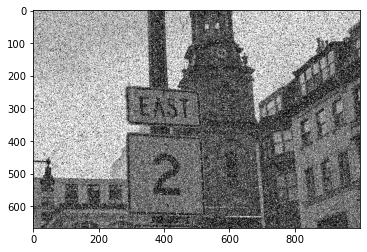

In [19]:
sp_noise(img,0.4)

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

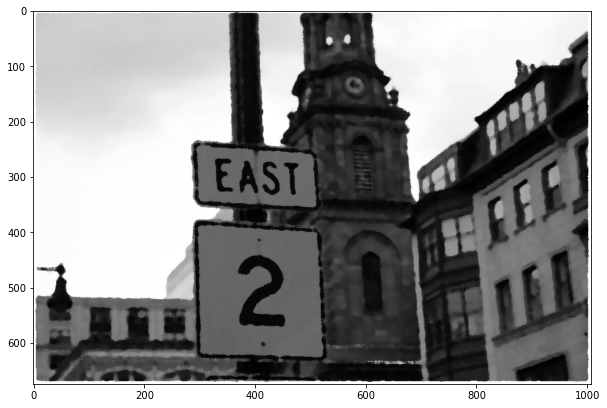

In [20]:
m_filter(img,9,"median")

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

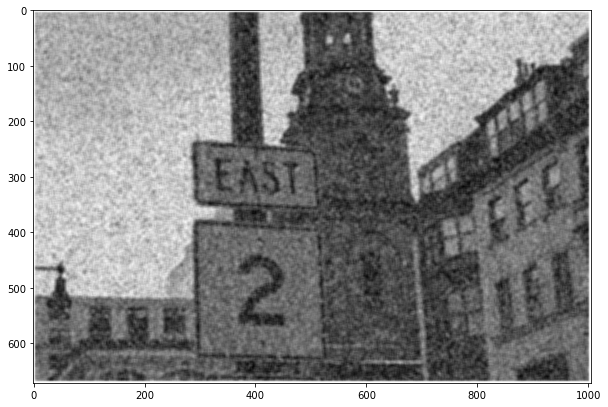

In [21]:
m_filter(img,7,"mean")

array([[1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       ...,
       [1.        , 0.61176467, 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 0.56862742, 0.58039215, ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ]])

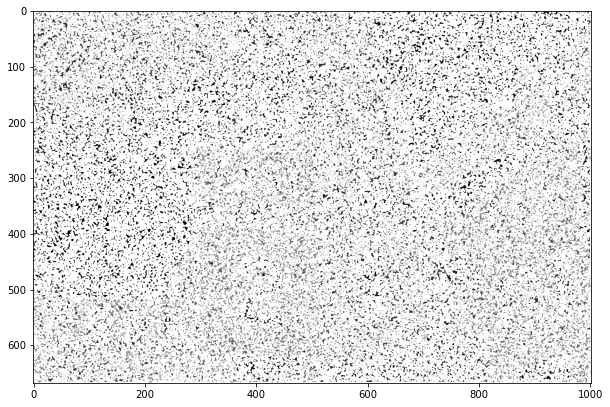

In [22]:
new_filter(img,3)

### Investigate from observations

Which filter, mean or median works better for reducing noise and why?

- Median filter worked better for reducing noise because it follows the most used surrounding pixels. Assuming the noise occur around the boundary of two colors. It will replace to color which occured more in surrounding. Therefore, they are able to remove unsuitable noise significantly. However, mean filter did not function as I expected due to the functionality of filter. Our range of pixels are [0,1]. Assuming the noise occured around the boundary of two colors and only using mean filter for 2 pixels. If each pixels are 0 and 1, then it will return 0.5 which the image looks smooth and blur instead of removing the noise. Therefore, mean filter is not efficient in removing noises.


What happens as the value of s in these filters is increased?

- For both median and mean filter, they improve removing the noises. However, the resolution(visual) is becoming bad which blurring occurs. Due to the grid(frame) we added to photo, increase of 's' will eventually become color of grid(frame).

What happens as the level of noise in an image is increased?

- It obviously increases the amount of noise in image which eventually become not recognizable. From observation in provided image, above 50% of noises start the image not recognizable.

You can also include ideas how the process of noise reduction could be improved.

- As I learned the fact that following the dominant color of surrounding pixels is the best to remove noises, I think if we could make the size of pixels more smaller will let the noise reduction more nicely.

### Extra Credit

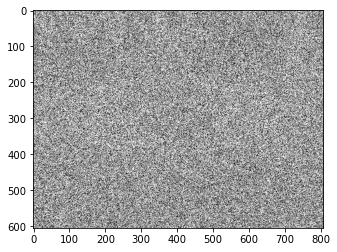

In [23]:
temp_img = plt.imread('bonusA_noise (2).jpg')
r= temp_img[:,:,0] # red
g= temp_img[:,:,1] # green
b= temp_img[:,:,2] # blue
img = 0.299*r + 0.587 * g + 0.114 * b # forumla transform to 1 channel
plt.imshow(img, cmap='gray')
img = img / 255

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

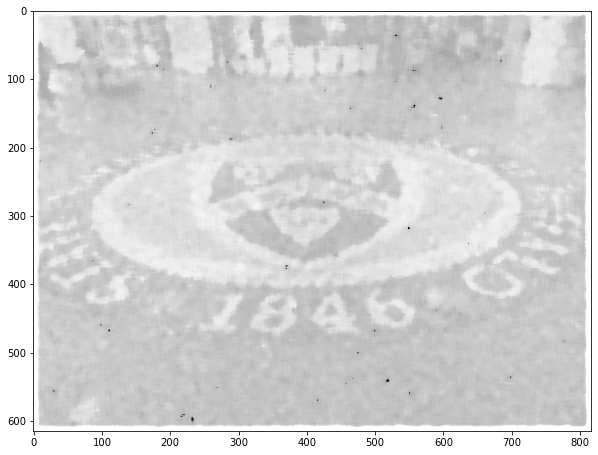

In [24]:
m_filter(img,11,"median")

Photo of location with myself

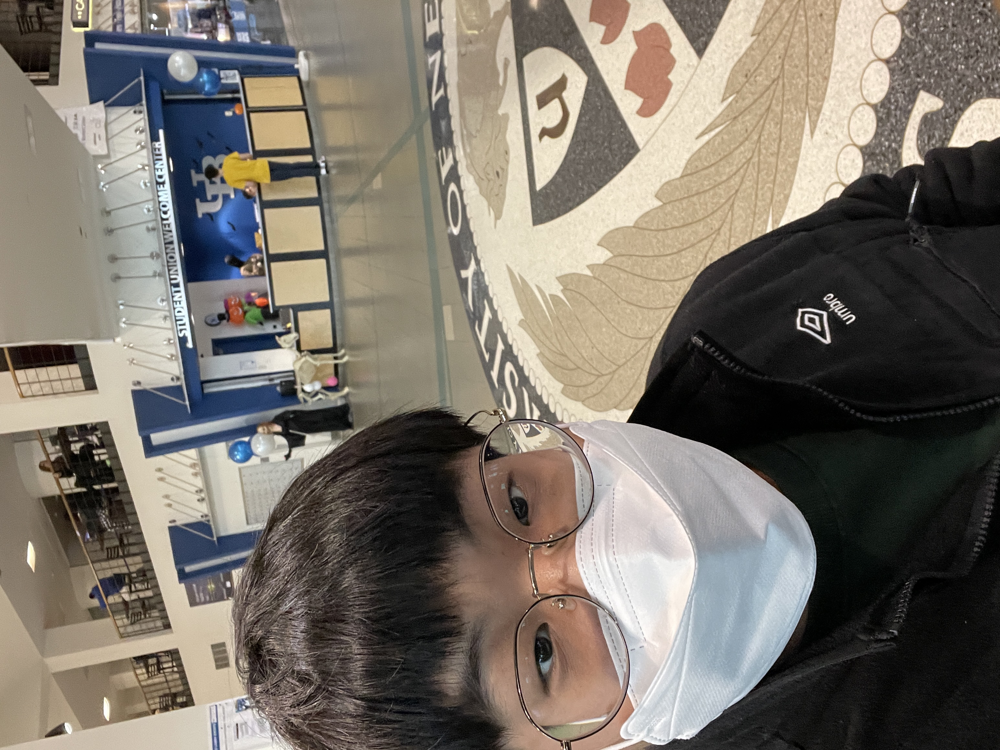

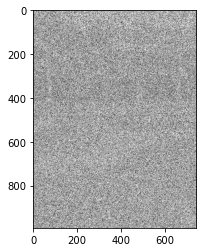

In [25]:
temp_img = plt.imread('bonusB_noise (1).jpg')
r= temp_img[:,:,0] # red
g= temp_img[:,:,1] # green
b= temp_img[:,:,2] # blue
img = 0.299*r + 0.587 * g + 0.114 * b # forumla transform to 1 channel
plt.imshow(img, cmap='gray')
img = img / 255

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

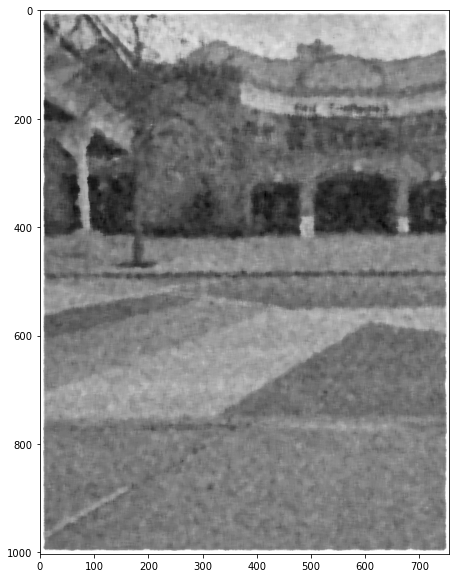

In [26]:
m_filter(img,11,"median")

Photo of location with myself

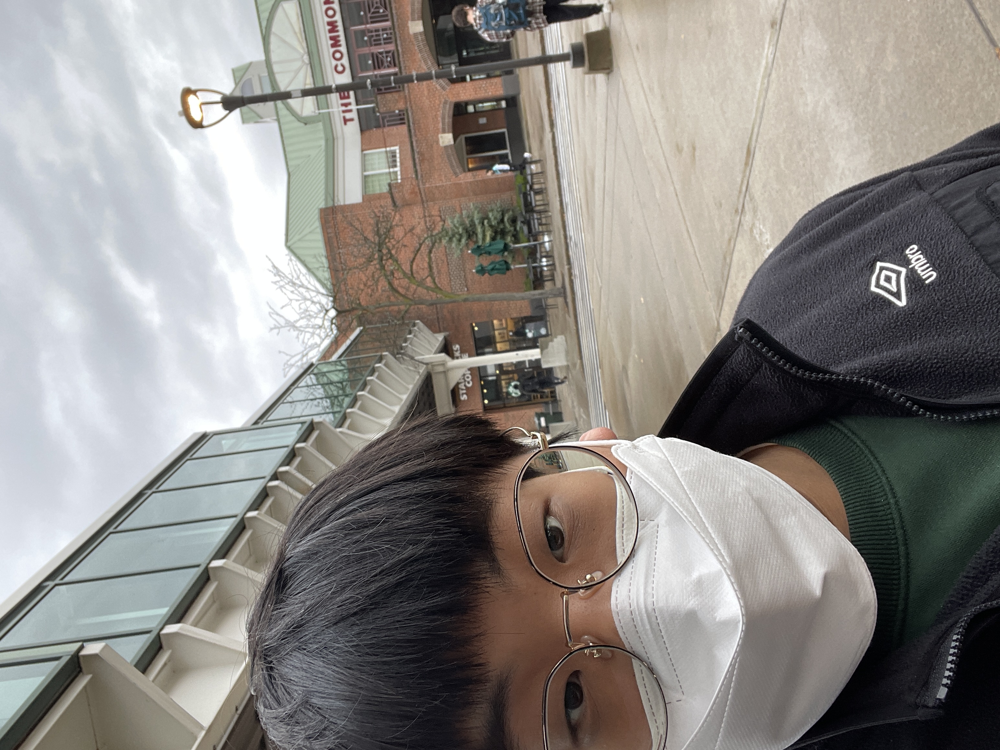

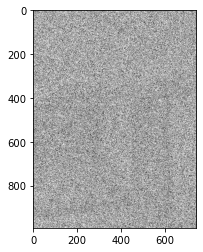

In [27]:
temp_img = plt.imread('bonusC_noise.jpg')
r= temp_img[:,:,0] # red
g= temp_img[:,:,1] # green
b= temp_img[:,:,2] # blue
img = 0.299*r + 0.587 * g + 0.114 * b # forumla transform to 1 channel
plt.imshow(img, cmap='gray')
img = img / 255

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

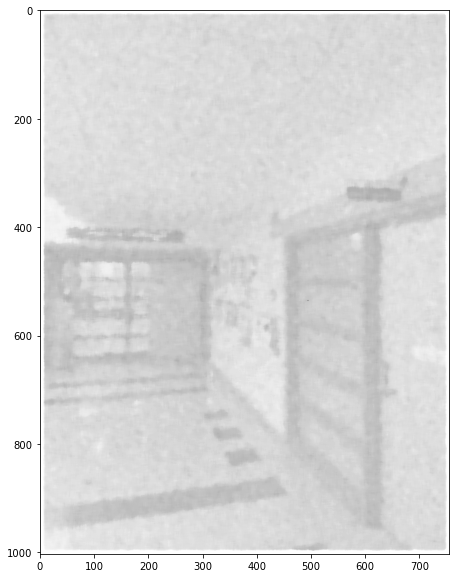

In [28]:
m_filter(img,11,"median")

Photo of location with myself

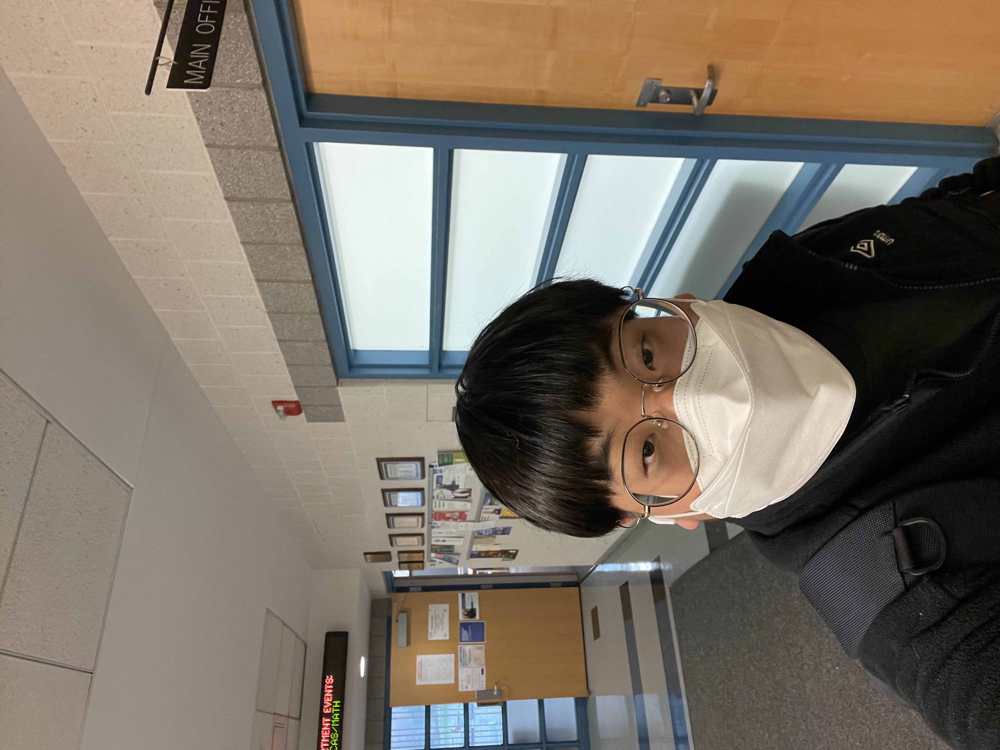